# Recon-Attack Analysis and Detection

In [2]:
import zipfile
import numpy as np
import os
import pandas as pd

#### Below code is for extracting the file from zip folder and commented it as there is no need for extracting it again

In [49]:
## Path to the ZIP file
#zip_file_path = 'pass your zip folder path here'

# Directory where you want to extract the files
extract_dir = 'extracted_files'

# Create the directory if it doesn't exist
# os.makedirs(extract_dir, exist_ok=True)

# # Open and extract the ZIP file
# with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_dir)

# List the extracted files
extracted_files = os.listdir(extract_dir)

In [50]:
#Finding a good size of subset of data
Benign_Reccon_attack_ratio = {}
for file_name in extracted_files:
    file_path = os.path.join(extract_dir, file_name)
    if file_name.endswith('.csv'):
        df = pd.read_csv(file_path)
#         Benign_Reccon_attack_ratio[file_name]=(len(df[df['label'].str.contains('Recon|VulnerabilityScan', case=False, na=False)]) / df.label.value_counts()['BenignTraffic'])
        Benign_Reccon_attack_ratio[file_name]=len(df[df['label'].str.contains('Recon|VulnerabilityScan', case=False, na=False)])
        del df

In [51]:
#Select the file with max in order to get good subset (as it contain more attacks records than other)
file=max(Benign_Reccon_attack_ratio.items(), key=lambda x: x[1])
file

('part-00131-363d1ba3-8ab5-4f96-bc25-4d5862db7cb9-c000.csv', 3543)

In [52]:
file_path = os.path.join(extract_dir, file[0])
data = pd.read_csv(file_path)

In [53]:
#checking the retrieved data
data

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,0.000000,0.00,1.00,64.00,1.008054,1.008054,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.312441e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood
1,0.000000,54.00,6.00,64.00,1.499689,1.499689,0.0,1.0,0.0,1.0,...,0.000000,54.00,8.334428e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-RSTFINFlood
2,0.056092,15942.00,17.00,64.00,5759.748962,5759.748962,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.309836e+07,9.5,10.000000,0.000000,0.000000,0.00,141.55,DDoS-UDP_Flood
3,0.000000,54.00,6.00,64.00,119.268178,119.268178,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.333182e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-PSHACK_Flood
4,0.000000,0.00,1.00,64.00,4.289468,4.289468,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.312489e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445750,0.249863,25228.50,16.83,63.36,10767.335546,10767.335546,0.0,0.0,0.0,0.0,...,0.377989,50.10,8.310186e+07,9.5,10.011452,0.535314,1.045327,0.14,141.55,DDoS-UDP_Flood
445751,3.901119,108.00,6.00,64.00,0.512674,0.512674,0.0,0.0,1.0,0.0,...,0.000000,54.00,8.298555e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DoS-SYN_Flood
445752,0.381013,44776.88,17.00,63.80,5971.800067,5971.800067,0.0,0.0,0.0,0.0,...,2.686016,50.59,8.310227e+07,9.5,10.086712,3.803066,46.792148,0.16,141.55,DDoS-UDP_Flood
445753,0.000000,54.00,6.00,64.00,125.572325,125.572325,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.333179e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-PSHACK_Flood


In [54]:
data.columns

Index(['flow_duration', 'Header_Length', 'Protocol Type', 'Duration', 'Rate',
       'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number',
       'rst_flag_number', 'psh_flag_number', 'ack_flag_number',
       'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count',
       'fin_count', 'urg_count', 'rst_count', 'HTTP', 'HTTPS', 'DNS', 'Telnet',
       'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 'ARP', 'ICMP', 'IPv', 'LLC',
       'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number',
       'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'label'],
      dtype='object')

In [55]:
data.label.unique()

array(['DDoS-ICMP_Flood', 'DDoS-RSTFINFlood', 'DDoS-UDP_Flood',
       'DDoS-PSHACK_Flood', 'DDoS-SynonymousIP_Flood', 'DDoS-TCP_Flood',
       'DDoS-SYN_Flood', 'DDoS-ACK_Fragmentation', 'DoS-SYN_Flood',
       'DoS-UDP_Flood', 'DoS-TCP_Flood', 'Mirai-greeth_flood',
       'BenignTraffic', 'Mirai-udpplain', 'Mirai-greip_flood',
       'DDoS-ICMP_Fragmentation', 'Recon-OSScan', 'Recon-PortScan',
       'DNS_Spoofing', 'VulnerabilityScan', 'MITM-ArpSpoofing',
       'BrowserHijacking', 'Recon-HostDiscovery',
       'DDoS-UDP_Fragmentation', 'DoS-HTTP_Flood', 'DDoS-HTTP_Flood',
       'DictionaryBruteForce', 'DDoS-SlowLoris', 'CommandInjection',
       'Recon-PingSweep', 'XSS', 'SqlInjection', 'Backdoor_Malware',
       'Uploading_Attack'], dtype=object)

In [56]:
data

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,0.000000,0.00,1.00,64.00,1.008054,1.008054,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.312441e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood
1,0.000000,54.00,6.00,64.00,1.499689,1.499689,0.0,1.0,0.0,1.0,...,0.000000,54.00,8.334428e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-RSTFINFlood
2,0.056092,15942.00,17.00,64.00,5759.748962,5759.748962,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.309836e+07,9.5,10.000000,0.000000,0.000000,0.00,141.55,DDoS-UDP_Flood
3,0.000000,54.00,6.00,64.00,119.268178,119.268178,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.333182e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-PSHACK_Flood
4,0.000000,0.00,1.00,64.00,4.289468,4.289468,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.312489e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445750,0.249863,25228.50,16.83,63.36,10767.335546,10767.335546,0.0,0.0,0.0,0.0,...,0.377989,50.10,8.310186e+07,9.5,10.011452,0.535314,1.045327,0.14,141.55,DDoS-UDP_Flood
445751,3.901119,108.00,6.00,64.00,0.512674,0.512674,0.0,0.0,1.0,0.0,...,0.000000,54.00,8.298555e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DoS-SYN_Flood
445752,0.381013,44776.88,17.00,63.80,5971.800067,5971.800067,0.0,0.0,0.0,0.0,...,2.686016,50.59,8.310227e+07,9.5,10.086712,3.803066,46.792148,0.16,141.55,DDoS-UDP_Flood
445753,0.000000,54.00,6.00,64.00,125.572325,125.572325,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.333179e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-PSHACK_Flood


In [57]:
#Getting information of our dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 445755 entries, 0 to 445754
Data columns (total 47 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   flow_duration    445755 non-null  float64
 1   Header_Length    445755 non-null  float64
 2   Protocol Type    445755 non-null  float64
 3   Duration         445755 non-null  float64
 4   Rate             445755 non-null  float64
 5   Srate            445755 non-null  float64
 6   Drate            445755 non-null  float64
 7   fin_flag_number  445755 non-null  float64
 8   syn_flag_number  445755 non-null  float64
 9   rst_flag_number  445755 non-null  float64
 10  psh_flag_number  445755 non-null  float64
 11  ack_flag_number  445755 non-null  float64
 12  ece_flag_number  445755 non-null  float64
 13  cwr_flag_number  445755 non-null  float64
 14  ack_count        445755 non-null  float64
 15  syn_count        445755 non-null  float64
 16  fin_count        445755 non-null  floa

## Data Processing

### Cleaning the data

In [58]:
# Checking for Null or missing values
data.isnull().sum()

flow_duration      0
Header_Length      0
Protocol Type      0
Duration           0
Rate               0
Srate              0
Drate              0
fin_flag_number    0
syn_flag_number    0
rst_flag_number    0
psh_flag_number    0
ack_flag_number    0
ece_flag_number    0
cwr_flag_number    0
ack_count          0
syn_count          0
fin_count          0
urg_count          0
rst_count          0
HTTP               0
HTTPS              0
DNS                0
Telnet             0
SMTP               0
SSH                0
IRC                0
TCP                0
UDP                0
DHCP               0
ARP                0
ICMP               0
IPv                0
LLC                0
Tot sum            0
Min                0
Max                0
AVG                0
Std                0
Tot size           0
IAT                0
Number             0
Magnitue           0
Radius             0
Covariance         0
Variance           0
Weight             0
label              0
dtype: int64

### No missing values are found.

### Checking for duplicates Values

In [59]:
#Finding the redundant values
data.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
445750    False
445751    False
445752    False
445753    False
445754    False
Length: 445755, dtype: bool

In [60]:
data.duplicated().sum()

0

### No duplicate Value found

### Pcking Up Bengin and Recon Types of Attacks 

In [61]:
data = data[data['label'].str.contains('Recon|VulnerabilityScan|BenignTraffic', case=False, na=False)]
data

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
43,59.958907,4129929.4,6.0,114.9,60.987132,60.987132,0.0,0.0,0.0,0.0,...,845.404857,1369.2,3.737926e-04,5.5,48.146780,1195.583015,8.076468e+05,0.9,38.5,BenignTraffic
66,20.643120,2113572.2,6.0,181.6,73.599931,73.599931,0.0,0.0,0.0,0.0,...,1231.454255,66.0,1.665249e+08,13.5,47.838255,1743.731154,1.520930e+06,1.0,244.6,BenignTraffic
107,88.251740,40191.5,7.6,74.9,6.565013,6.565013,0.0,0.0,0.0,0.0,...,188.208957,143.5,1.664310e+08,13.5,18.474585,266.566037,3.575023e+04,1.0,244.6,Recon-OSScan
126,62.872302,404714.0,6.0,165.0,73.020604,73.020604,0.0,0.0,0.0,0.0,...,102.444868,158.4,1.665249e+08,13.5,13.751859,145.474362,1.674218e+04,1.0,244.6,BenignTraffic
128,82.240797,80154.8,5.4,52.8,16.384413,16.384413,0.0,0.0,0.0,0.0,...,65.467219,77.3,1.664293e+08,13.5,14.248669,92.779716,4.319661e+03,1.0,244.6,Recon-PortScan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445573,11.422471,399375.0,5.4,191.2,145.342632,145.342632,0.0,0.0,0.0,0.0,...,19.119345,74.4,3.783011e-03,5.5,12.067518,27.038837,5.996675e+02,0.7,38.5,BenignTraffic
445681,40.818306,43853.8,6.0,59.6,12.298885,12.298885,0.0,0.0,0.0,0.0,...,62.771270,112.6,1.665183e+08,13.5,15.014174,88.834122,3.952713e+03,1.0,244.6,BenignTraffic
445692,1.364146,88276.0,6.0,234.0,59.010156,59.010156,0.0,0.0,0.0,0.0,...,0.000000,66.0,1.665208e+08,13.5,11.489125,0.000000,0.000000e+00,0.0,244.6,BenignTraffic
445734,101.062645,486943.2,6.0,74.0,16.920060,16.920060,0.0,0.0,0.0,0.0,...,80.480710,257.4,2.195199e-02,5.5,15.057632,113.816911,1.993183e+04,0.9,38.5,BenignTraffic


In [62]:
data.describe()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,AVG,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight
count,14050.000000,1.405000e+04,14050.000000,14050.000000,14050.000000,14050.000000,14050.0,14050.000000,14050.000000,14050.000000,...,14050.000000,14050.000000,14050.000000,1.405000e+04,14050.00000,14050.000000,14050.000000,1.405000e+04,14050.000000,14050.000000
mean,103.596066,7.890157e+05,7.513639,110.420140,1857.628296,1857.628296,0.0,0.000142,0.038505,0.023488,...,511.809928,400.630150,515.546496,8.385088e+07,9.52719,26.635973,565.958270,4.923243e+05,0.850127,142.248921
std,1120.568175,1.233461e+06,2.272351,50.074671,17273.832386,17273.832386,0.0,0.011931,0.192420,0.151451,...,624.618165,524.385368,638.220788,8.211966e+07,3.94497,16.977305,742.340628,1.468390e+06,0.253644,101.626095
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,50.845000,0.000000,51.800000,1.311302e-06,4.50000,10.082921,0.000000,0.000000e+00,0.000000,25.500000
25%,7.423453,2.072235e+04,6.000000,69.800000,17.634973,17.634973,0.0,0.000000,0.000000,0.000000,...,90.601246,43.304516,87.922500,7.061744e-03,5.50000,13.362754,61.065114,2.265518e+03,0.900000,38.500000
50%,26.829248,2.248935e+05,6.500000,96.150000,45.631121,45.631121,0.0,0.000000,0.000000,0.000000,...,163.487501,133.320889,145.750000,8.324308e+07,9.50000,17.762839,185.782063,2.657746e+04,0.900000,141.550000
75%,60.353202,1.064398e+06,8.200000,137.300000,75.530150,75.530150,0.0,0.000000,0.000000,0.000000,...,819.875331,656.359890,815.400000,1.665208e+08,13.50000,39.629151,927.902177,4.821443e+05,1.000000,244.600000
max,64023.939954,8.754550e+06,17.000000,255.000000,466041.906529,466041.906529,0.0,1.000000,1.000000,1.000000,...,6249.342579,6953.284974,6294.800000,1.668486e+08,14.50000,106.793797,9833.429913,5.548045e+07,1.000000,244.600000


In [63]:
data.shape

(14050, 47)

### Finding Constant Column

In [64]:
constant_columns = data.columns[data.nunique() <= 1]
constant_columns

Index(['Drate', 'ece_flag_number', 'cwr_flag_number', 'Telnet', 'SMTP', 'SSH',
       'IRC', 'DHCP', 'ICMP'],
      dtype='object')

### In the data preprocessing phase, nine columns containing constant values were identified and subsequently removed from the DataFrame, as they did not contribute to the variability in the dataset or influence the analysis outcomes.

In [65]:
data = data.drop(columns=constant_columns)
data.shape

(14050, 38)

In [66]:
data.label.unique()

array(['BenignTraffic', 'Recon-OSScan', 'Recon-PortScan',
       'VulnerabilityScan', 'Recon-HostDiscovery', 'Recon-PingSweep'],
      dtype=object)

In [67]:
data.label.value_counts()

label
BenignTraffic          10507
Recon-HostDiscovery     1310
Recon-OSScan            1005
Recon-PortScan           813
VulnerabilityScan        387
Recon-PingSweep           28
Name: count, dtype: int64

### Label column Encoding

In [68]:
#write down the mapping for label column in two classification (Benign=0 and Attack=1)
label_mapping = {
    'BenignTraffic': 0,
    'Recon-OSScan': 1,
    'Recon-PortScan': 1,
    'VulnerabilityScan': 1,
    'Recon-HostDiscovery': 1,
    'Recon-PingSweep': 1,
}
new = data

In [69]:
data.loc[:, 'label'] = data['label'].replace(label_mapping)
data['label']

43        0
66        0
107       1
126       0
128       1
         ..
445573    0
445681    0
445692    0
445734    0
445741    0
Name: label, Length: 14050, dtype: object

## Performing EDA

In [70]:
#Importing required libraries
import seaborn as sns
import matplotlib.pyplot as plt

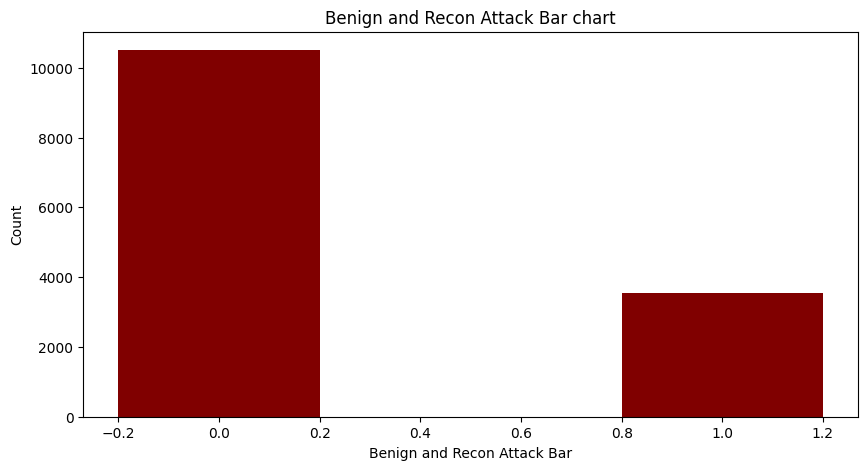

In [48]:
pp = data.label.value_counts()

courses = list(pp.keys())
values = list(pp.values)
 
fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, color ='maroon', 
        width = 0.4)

plt.xlabel("Benign and Recon Attack Bar")
plt.ylabel("Count")
plt.title("Benign and Recon Attack Bar chart")

plt.savefig('Benign_and_Recon_Attack_Bar_chart.png', dpi=300, bbox_inches='tight')

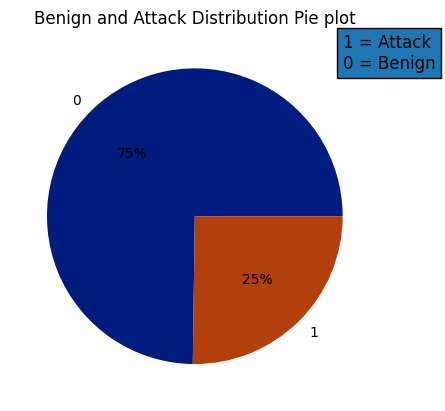

In [143]:
#plotting pie graph
labelClass =dict(data['label'].sort_values().value_counts())
values = labelClass.values()
keys = labelClass.keys()

# define Seaborn color palette to use
palette_color = sns.color_palette('dark')

plt.title("Benign and Attack Distribution Pie plot")
plt.text(1,1,"1 = Attack\n0 = Benign", fontsize= 12, style='normal', bbox={})

# plotting data on chart
plt.pie(values, labels=keys, colors=palette_color, autopct='%.0f%%')

plt.savefig('label Distribution Pie plot.png', dpi=300, bbox_inches='tight')

### Description
The pie plot or pie graph shows the distribution of the Benign and Recon-Attacks in the dataset. It reveals that the majority of  data are Benign. The dataset contains 75% Benign data and 25% Attacks data.

### Bivariate Analysis
#### Analyzing relationship of varibales with eachother

In [154]:
#Analyzing relationship of varibales with eachother
correlation = data.corr() #returns the correlation cofficeient against each varibale with each other varibale
correlation

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,fin_flag_number,syn_flag_number,rst_flag_number,psh_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
flow_duration,1.000000,-0.029169,0.085628,-0.025707,-0.000404,-0.000404,-0.000765,-0.011377,-0.012077,0.006773,...,-0.034839,-0.034756,0.003387,0.003415,-0.039051,-0.034764,-0.019120,0.027696,0.003419,0.098883
Header_Length,-0.029169,1.000000,-0.247008,0.236107,-0.038061,-0.038061,-0.007499,-0.127665,-0.098395,-0.055653,...,0.244101,0.308325,0.002328,0.002633,0.337073,0.243867,0.122228,-0.088708,0.002622,-0.321105
Protocol Type,0.085628,-0.247008,1.000000,-0.146833,0.102933,0.102933,-0.005060,-0.124890,-0.099794,-0.068791,...,-0.203762,-0.260993,-0.002092,-0.001732,-0.259900,-0.203637,-0.109740,0.203099,-0.001792,0.011164
Duration,-0.025707,0.236107,-0.146833,1.000000,-0.029824,-0.029824,-0.009000,-0.186053,0.012492,0.044940,...,-0.009966,-0.245162,0.011736,0.011831,-0.114449,-0.009460,-0.000895,-0.156158,0.011880,-0.170334
Rate,-0.000404,-0.038061,0.102933,-0.029824,1.000000,1.000000,-0.001275,-0.019860,-0.015456,0.000365,...,-0.033897,-0.040984,0.004657,0.004630,-0.036218,-0.033798,-0.020872,0.022097,0.004632,-0.021240
Srate,-0.000404,-0.038061,0.102933,-0.029824,1.000000,1.000000,-0.001275,-0.019860,-0.015456,0.000365,...,-0.033897,-0.040984,0.004657,0.004630,-0.036218,-0.033798,-0.020872,0.022097,0.004632,-0.021240
fin_flag_number,-0.000765,-0.007499,-0.005060,-0.009000,-0.001275,-0.001275,1.000000,-0.002388,-0.001850,-0.001680,...,0.000115,-0.008026,0.011999,0.012016,-0.006090,0.000145,-0.001324,0.007051,0.012017,0.020548
syn_flag_number,-0.011377,-0.127665,-0.124890,-0.186053,-0.019860,-0.019860,-0.002388,1.000000,-0.031036,-0.028170,...,-0.143593,-0.141181,0.005500,0.005372,-0.180071,-0.143280,-0.064254,-0.201988,0.005375,0.344620
rst_flag_number,-0.012077,-0.098395,-0.099794,0.012492,-0.015456,-0.015456,-0.001850,-0.031036,1.000000,-0.021832,...,-0.112995,-0.111029,0.009481,0.009415,-0.142936,-0.112749,-0.051355,-0.141826,0.009418,0.267075
psh_flag_number,0.006773,-0.055653,-0.068791,0.044940,0.000365,0.000365,-0.001680,-0.028170,-0.021832,1.000000,...,0.017018,0.075376,0.004237,0.004258,0.061751,0.017147,-0.003615,0.031257,0.004261,-0.005750


In [155]:
min(list(correlation.min()))

-0.7132486919622638

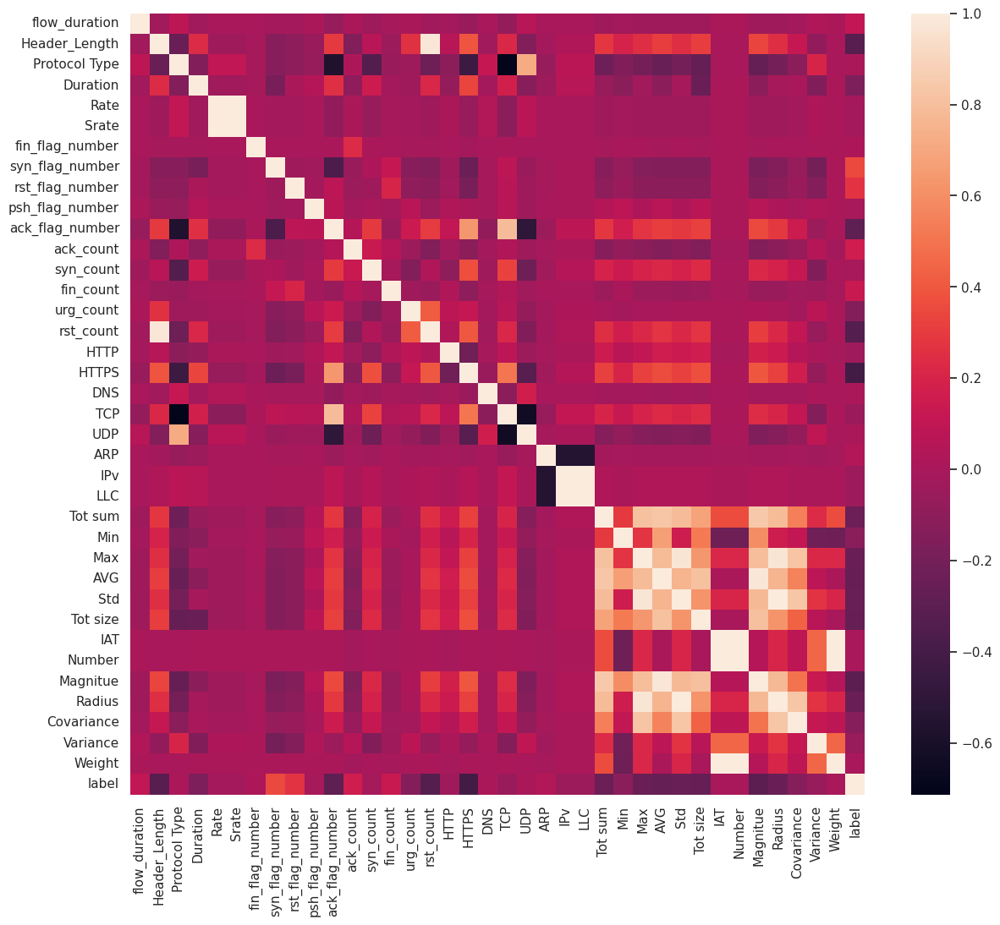

In [165]:
#HeatMap
#defining size of the picture

sns.set(rc={'figure.figsize':(14,12)})
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns)
plt.savefig('heatmap.png', dpi=300)

In [166]:
correlation.sort_values('label')

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,fin_flag_number,syn_flag_number,rst_flag_number,psh_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
HTTPS,-0.060109,0.390631,-0.433829,0.334052,-0.059461,-0.059461,-0.014321,-0.240184,-0.185183,0.015583,...,0.314222,0.368762,0.009178,0.009154,0.394943,0.313734,0.168813,-0.077066,0.009131,-0.407008
rst_count,-0.024147,0.978102,-0.234494,0.215217,-0.038220,-0.038220,-0.007882,-0.145165,-0.111729,-0.050541,...,0.218617,0.272523,0.005080,0.005380,0.304023,0.218354,0.104405,-0.062528,0.005381,-0.331995
Header_Length,-0.029169,1.000000,-0.247008,0.236107,-0.038061,-0.038061,-0.007499,-0.127665,-0.098395,-0.055653,...,0.244101,0.308325,0.002328,0.002633,0.337073,0.243867,0.122228,-0.088708,0.002622,-0.321105
Magnitue,-0.039051,0.337073,-0.259900,-0.114449,-0.036218,-0.036218,-0.006090,-0.180071,-0.142936,0.061751,...,0.777174,0.802508,0.050906,0.050725,1.000000,0.776966,0.498025,0.134405,0.050683,-0.300684
ack_flag_number,-0.064189,0.295756,-0.568206,0.256141,-0.086251,-0.086251,0.006409,-0.369014,0.081049,0.075612,...,0.285208,0.314709,0.008158,0.008204,0.345349,0.284710,0.144897,-0.050594,0.008196,-0.295140
AVG,-0.037584,0.308840,-0.254362,-0.116111,-0.037621,-0.037621,-0.006296,-0.141424,-0.111631,0.065750,...,0.755779,0.806780,0.003294,0.003075,0.975319,0.755576,0.551952,0.077497,0.003041,-0.260274
Tot size,-0.034756,0.308325,-0.260993,-0.245162,-0.040984,-0.040984,-0.008026,-0.141181,-0.111029,0.075376,...,0.620518,1.000000,-0.002401,-0.002645,0.802508,0.619087,0.432739,0.065688,-0.002667,-0.258992
Std,-0.034839,0.244101,-0.203762,-0.009966,-0.033897,-0.033897,0.000115,-0.143593,-0.112995,0.017018,...,1.000000,0.620518,0.206365,0.206610,0.777174,0.999928,0.831223,0.265567,0.206613,-0.251905
Radius,-0.034764,0.243867,-0.203637,-0.009460,-0.033798,-0.033798,0.000145,-0.143280,-0.112749,0.017147,...,0.999928,0.619087,0.205325,0.205569,0.776966,1.000000,0.831539,0.264879,0.205571,-0.251300
Max,-0.035819,0.245483,-0.200799,-0.024925,-0.034048,-0.034048,0.001944,-0.137241,-0.108125,0.019866,...,0.968015,0.636360,0.212364,0.212401,0.793276,0.967987,0.821197,0.219087,0.212407,-0.249721


### Outcomes:
Max Positive correlation: Between label and syn_flag_number, 
Max Negative Correlation: Between label and HTTPS	

In [168]:
sns.set(rc={'figure.figsize':(14,12)})
sns.pairplot(data)
plt.savefig('pairplot.png', dpi=300, bbox_inches='tight')

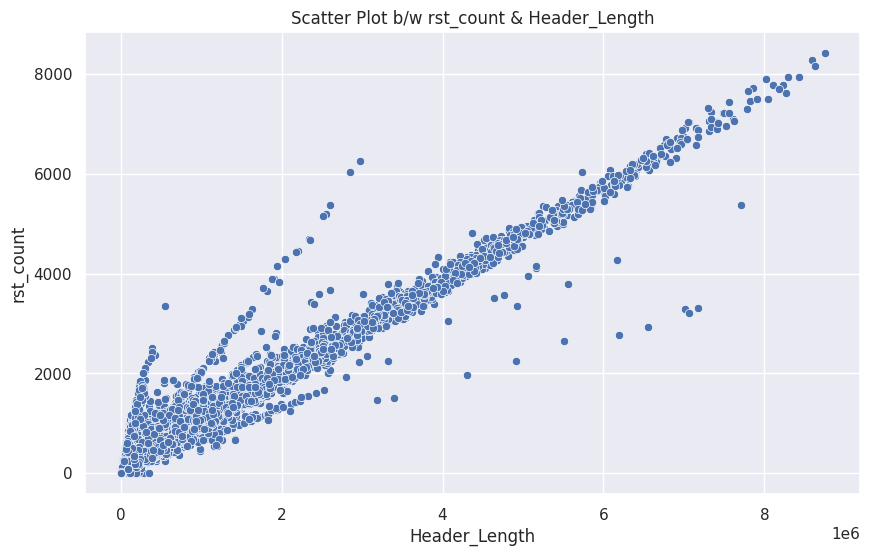

In [175]:
sns.scatterplot(x='Header_Length',y='rst_count', data= data).set(title='Scatter Plot b/w rst_count & Header_Length')
sns.set(rc={'figure.figsize':(10,6)})
plt.savefig('Header_Length_and_rst_count_scatter_plot.png', dpi=300)

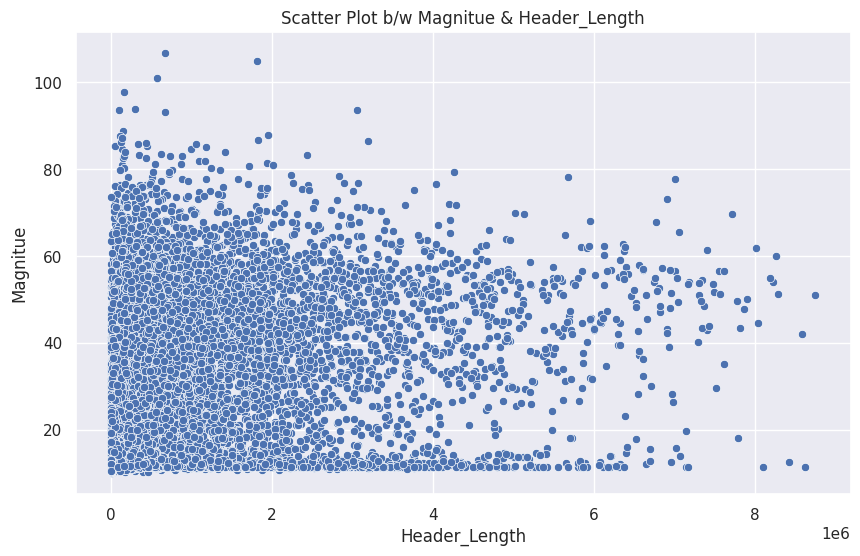

In [176]:
sns.scatterplot(x='Header_Length',y='Magnitue', data= data).set(title='Scatter Plot b/w Magnitue & Header_Length')
sns.set(rc={'figure.figsize':(10,6)})
plt.savefig('Header_Length_and_Magnitue_scatter_plot.png', dpi=300)

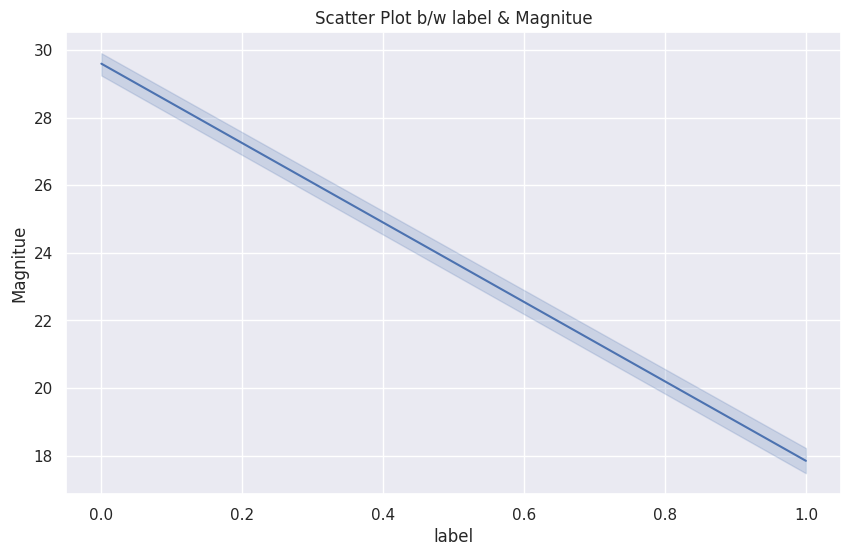

In [181]:
# draw lineplot
sns.lineplot(x='label',y='Magnitue', data= data).set(title='Scatter Plot b/w label & Magnitue')
plt.savefig('label_and_Magnitue_Line_plot.png', dpi=300)

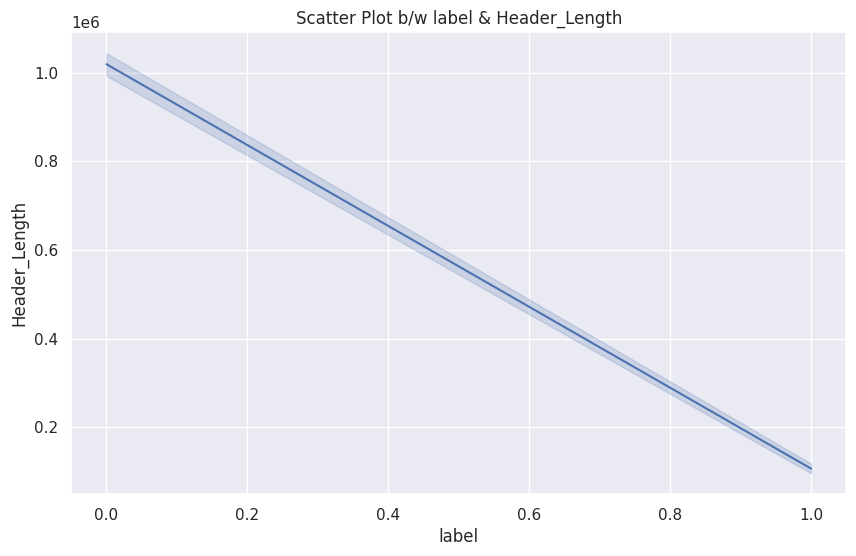

In [180]:
# draw lineplot
sns.lineplot(x='label',y='Header_Length', data= data).set(title='Scatter Plot b/w label & Header_Length')
plt.savefig('label_and_Header_Length_Line_plot.png', dpi=300)

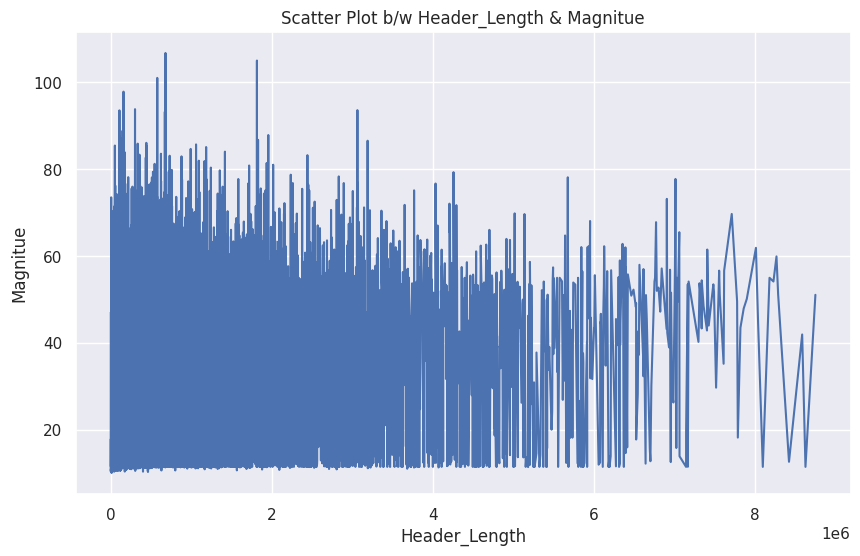

In [182]:
# draw lineplot
sns.lineplot(x='Header_Length',y='Magnitue', data= data).set(title='Scatter Plot b/w Header_Length & Magnitue')
plt.savefig('Header_Length_and_Magnitue_Line_plot.png', dpi=300)

### Description:
This scatter plot reflects that rst_count and header_length are in a moderate positive relation. As the value of the Header_Length and Magnitude are rises there are more chance that of Attack. There outliers can be seen in the plot.  

## Scaling

In [71]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = StandardScaler()

normalized_data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)
normalized_data 

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,fin_flag_number,syn_flag_number,rst_flag_number,psh_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,-0.038943,2.708665,-0.666135,0.089467,-0.104013,-0.104013,-0.011932,-0.200118,-0.155089,-0.140768,...,0.848213,1.337600,-1.021118,-1.020878,1.267078,0.848192,0.214748,0.196632,-1.020925,-0.580692
1,-0.074030,1.073892,-0.666135,1.421525,-0.103283,-0.103283,-0.011932,-0.200118,-0.155089,-0.140768,...,1.584433,-0.704400,1.006786,1.007093,1.248905,1.586623,0.700524,0.590898,1.007170,-0.580692
2,-0.013694,-0.607114,0.038006,-0.709369,-0.107164,-0.107164,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.405100,-0.582964,1.005642,1.007093,-0.480741,-0.403323,-0.310946,0.590898,1.007170,1.722082
3,-0.036343,-0.311575,-0.666135,1.090008,-0.103316,-0.103316,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.568658,-0.559617,1.006786,1.007093,-0.758929,-0.566450,-0.323891,0.590898,1.007170,-0.580692
4,-0.019058,-0.574713,-0.930188,-1.150725,-0.106595,-0.106595,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.639177,-0.686694,1.005622,1.007093,-0.729665,-0.637437,-0.332352,0.590898,1.007170,1.722082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14045,-0.082259,-0.315903,-0.930188,1.613245,-0.099130,-0.099130,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.727565,-0.691238,-1.021118,-1.020878,-0.858144,-0.725999,-0.334885,-0.591902,-1.020925,-0.580692
14046,-0.056025,-0.604144,-0.666135,-1.014923,-0.106832,-0.106832,-0.011932,-0.200118,-0.155089,7.103886,...,-0.644318,-0.631382,1.006706,1.007093,-0.684573,-0.642752,-0.332602,0.590898,1.007170,-0.580692
14047,-0.091235,-0.568129,-0.666135,2.467999,-0.104128,-0.104128,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.764027,-0.704400,1.006737,1.007093,-0.892214,-0.762424,-0.335294,-3.351768,1.007170,-0.580692
14048,-0.002261,-0.244907,-0.666135,-0.727342,-0.106564,-0.106564,-0.011932,-0.200118,-0.155089,-0.140768,...,-0.610545,-0.404493,-1.021118,-1.020878,-0.682014,-0.609097,-0.321719,0.196632,-1.020925,-0.580692


## Model Preparation

In [72]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay

### Separating Features and labels

In [73]:
features = data.drop('label', axis=1)
features

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,fin_flag_number,syn_flag_number,rst_flag_number,psh_flag_number,...,AVG,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight
43,59.958907,4129929.4,6.0,114.9,60.987132,60.987132,0.0,0.0,0.0,0.0,...,1243.534286,845.404857,1369.2,3.737926e-04,5.5,48.146780,1195.583015,8.076468e+05,0.9,38.5
66,20.643120,2113572.2,6.0,181.6,73.599931,73.599931,0.0,0.0,0.0,0.0,...,1148.740902,1231.454255,66.0,1.665249e+08,13.5,47.838255,1743.731154,1.520930e+06,1.0,244.6
107,88.251740,40191.5,7.6,74.9,6.565013,6.565013,0.0,0.0,0.0,0.0,...,170.163333,188.208957,143.5,1.664310e+08,13.5,18.474585,266.566037,3.575023e+04,1.0,244.6
126,62.872302,404714.0,6.0,165.0,73.020604,73.020604,0.0,0.0,0.0,0.0,...,96.086799,102.444868,158.4,1.665249e+08,13.5,13.751859,145.474362,1.674218e+04,1.0,244.6
128,82.240797,80154.8,5.4,52.8,16.384413,16.384413,0.0,0.0,0.0,0.0,...,101.454312,65.467219,77.3,1.664293e+08,13.5,14.248669,92.779716,4.319661e+03,1.0,244.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445573,11.422471,399375.0,5.4,191.2,145.342632,145.342632,0.0,0.0,0.0,0.0,...,72.953333,19.119345,74.4,3.783011e-03,5.5,12.067518,27.038837,5.996675e+02,0.7,38.5
445681,40.818306,43853.8,6.0,59.6,12.298885,12.298885,0.0,0.0,0.0,1.0,...,113.019447,62.771270,112.6,1.665183e+08,13.5,15.014174,88.834122,3.952713e+03,1.0,244.6
445692,1.364146,88276.0,6.0,234.0,59.010156,59.010156,0.0,0.0,0.0,0.0,...,66.000000,0.000000,66.0,1.665208e+08,13.5,11.489125,0.000000,0.000000e+00,0.0,244.6
445734,101.062645,486943.2,6.0,74.0,16.920060,16.920060,0.0,0.0,0.0,0.0,...,118.082540,80.480710,257.4,2.195199e-02,5.5,15.057632,113.816911,1.993183e+04,0.9,38.5


In [74]:
features = features.to_numpy()
features.shape

(14050, 37)

In [75]:
label = np.array(data['label'])

### Splitting the dataset into Train and Test

In [76]:
X_train, X_test, y_train, y_test = train_test_split(features, label, test_size=0.2, random_state=42)
y_train = y_train.astype('int')
y_test = y_test.astype('int')

In [77]:
Accuracy_dict = {}

In [78]:
def confusionMatrix(y_test, y_pred, model_name):
    cm = confusion_matrix(y_test, y_pred)
    cm_report = metrics.classification_report(y_test,y_pred, zero_division=0)
    print(cm_report)
    cmd = ConfusionMatrixDisplay(cm, display_labels=['1','0'])
    cmd.plot(colorbar=False, cmap='Blues')
    plt.savefig("confusion_matrix_with_"+model_name+"_37_variables.png")

#### KNN Model

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2090
           1       0.88      0.75      0.81       720

    accuracy                           0.91      2810
   macro avg       0.90      0.86      0.87      2810
weighted avg       0.91      0.91      0.91      2810



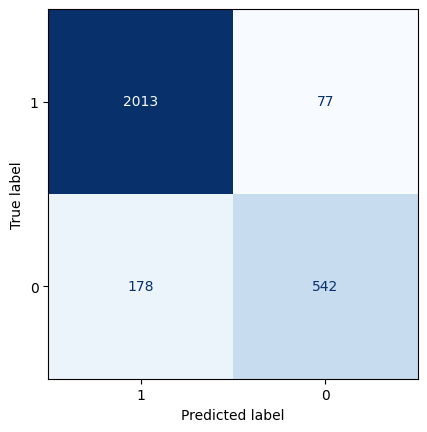

In [31]:
model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
ac  = accuracy_score(y_test, y_pred)
Accuracy_dict['KNN']=ac
confusionMatrix(y_test, y_pred, "KNN")

### KNN Give us 91% of Accuracy on this data

#### Random Forest Model

Accuracy is:  95.80071174377224
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2090
           1       0.95      0.89      0.92       720

    accuracy                           0.96      2810
   macro avg       0.95      0.93      0.94      2810
weighted avg       0.96      0.96      0.96      2810



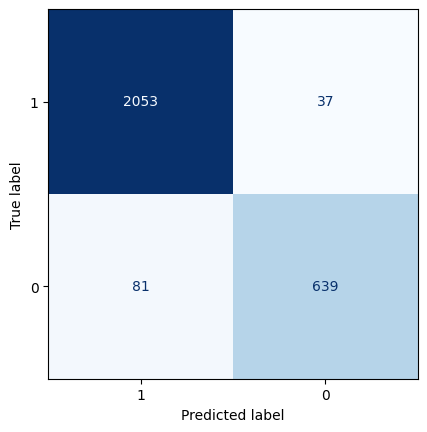

In [32]:
model = RandomForestClassifier(n_estimators=500, random_state=1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
ac=accuracy_score(y_test, y_pred)
print("Accuracy is: ",ac*100)
Accuracy_dict['RFM'] = ac
confusionMatrix(y_test, y_pred, "RFM")

### Random Forest Model Give 96% of Accuracy on this data

#### Logistic Regression

Accuracy is:  74.38
              precision    recall  f1-score   support

           0       0.74      1.00      0.85      2090
           1       0.00      0.00      0.00       720

    accuracy                           0.74      2810
   macro avg       0.37      0.50      0.43      2810
weighted avg       0.55      0.74      0.63      2810



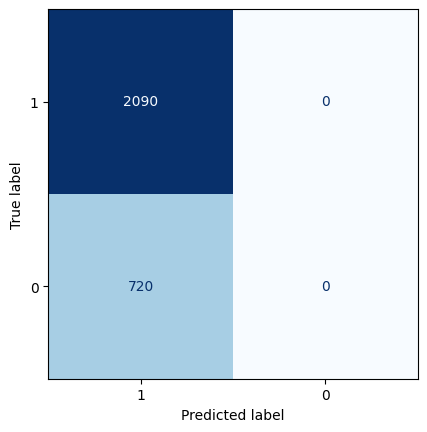

In [33]:
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
ac = accuracy_score(y_test, y_pred)
print("Accuracy is: ",round(ac*100,2))
Accuracy_dict['Logistic Regression'] = ac
confusionMatrix(y_test, y_pred, "Logistic_Regression")

### Logistic Regression Model Give 74.38% of Accuracy on this data

#### Decision Tree 

Accuracy is:  92.81
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      2090
           1       0.85      0.87      0.86       720

    accuracy                           0.93      2810
   macro avg       0.90      0.91      0.91      2810
weighted avg       0.93      0.93      0.93      2810



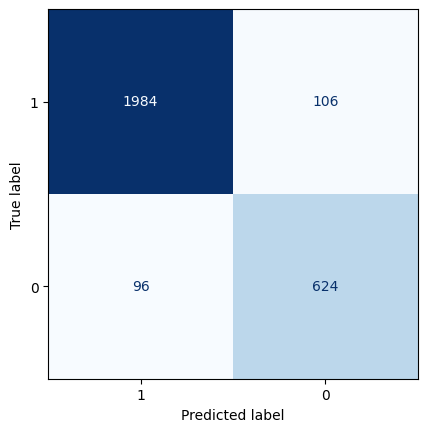

In [34]:
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
ac = accuracy_score(y_test, y_pred)
print("Accuracy is: ",round(ac*100,2))
Accuracy_dict['Decision Tree'] = ac
confusionMatrix(y_test, y_pred, "Decision_Tree")

### Decision Tree Model Give 93% of Accuracy on this data

### Which Model Perform Good

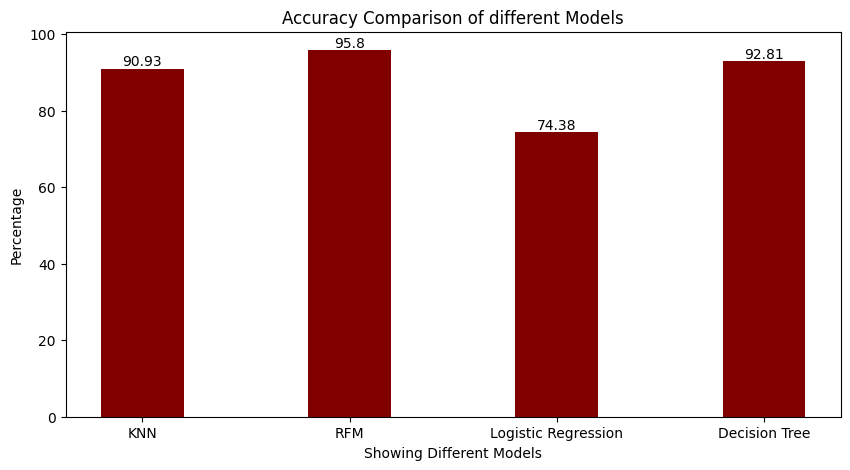

In [42]:
modified_data = {key: round(value * 100, 2) for key, value in Accuracy_dict.items()}
courses = list(modified_data.keys())
values = list(modified_data.values())

fig = plt.figure(figsize=(10, 5))

# Creating the bar plot
bars = plt.bar(courses, values, color='maroon', width=0.4)

# Adding the value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.xlabel("Showing Different Models")
plt.ylabel("Percentage")
plt.title("Accuracy Comparison of different Models")

# Saving the figure
plt.savefig('Benign_and_Recon_Attack_Bar_chart.png', dpi=300, bbox_inches='tight')

plt.show()

### Conclusion
Based on the analysis, it's evident that the Random Forest model outperforms the other models in terms of accuracy, achieving an impressive 96%. This suggests that Random Forest is highly effective in capturing the underlying patterns in the data, making it a reliable choice for your classification task.

The KNN and Decision Tree models also perform well, with accuracies of 91% and 93% respectively, indicating that they are reasonable alternatives, though slightly less robust than Random Forest. Logistic Regression, on the other hand, shows a significantly lower accuracy of 74%, suggesting that it might struggle with the complexity or non-linearity in the data.

In summary, the Random Forest model stands out as the best-performing model for this dataset, providing the most accurate predictions.